## Frontpage GIF of particle motions

This notebook provides the code that generates the animated gif on the [README](../README.md) page of the repository. This notebook heavily draws from the [Ocean Parcels example](https://docs.oceanparcels.org/en/latest/examples/documentation_homepage_animation.html). 

In [1]:
# library and modules import
import cartopy
import cartopy.crs as ccrs
import matplotlib.animation as animation
import matplotlib.pyplot as plt
import numpy as np
import xarray as xr
#from matplotlib import colors
from matplotlib.animation import FuncAnimation, PillowWriter, writers
# AWS S3 access module
import s3fs

The dataset is located on an AWS S3 bucket which we lazily open with xarray. We decide here to plot the motion of the particles in the 11-th set at 15-m depth:

In [2]:
# AWS set up
bucket_name = 'hycom-global-drifters'
s3 = s3fs.S3FileSystem(anon=True)
# choose step and depth
step = 11
depth = 15
# Define the path and get the size of the selected data:
zarr_store_path = bucket_name+'/lagrangian/global_hycom_'+str(depth)+'m_step_'+str(step)+'.zarr'
# Create Zarr store mapped objects
store = s3fs.S3Map(root=zarr_store_path, s3=s3)
pfile = xr.open_zarr(s3.get_mapper(zarr_store_path), consolidated=True)

In [3]:
# examine the dataset
pfile

<xarray.Dataset>
Dimensions:     (traj: 587225, obs: 1440)
Coordinates:
    id          (traj) int64 dask.array<chunksize=(587225,), meta=np.ndarray>
  * obs         (obs) int32 0 1 2 3 4 5 6 ... 1433 1434 1435 1436 1437 1438 1439
Dimensions without coordinates: traj
Data variables:
    depth       (traj, obs) float32 dask.array<chunksize=(23301, 1440), meta=np.ndarray>
    grounding   (traj, obs) bool dask.array<chunksize=(93206, 1440), meta=np.ndarray>
    lat         (traj, obs) float32 dask.array<chunksize=(23301, 1440), meta=np.ndarray>
    lon         (traj, obs) float32 dask.array<chunksize=(23301, 1440), meta=np.ndarray>
    ssh         (traj, obs) float32 dask.array<chunksize=(23301, 1440), meta=np.ndarray>
    steric_ssh  (traj, obs) float32 dask.array<chunksize=(23301, 1440), meta=np.ndarray>
    time        (traj, obs) datetime64[ns] dask.array<chunksize=(9176, 45), meta=np.ndarray>
    ve          (traj, obs) float32 dask.array<chunksize=(23301, 1440), meta=np.ndarray>
    vn          (traj, obs) float32 dask.array<chunksize=(23301, 1440), meta=np.ndarray>
Attributes:
    feature_type:      trajectory
    parcels_mesh:      spherical
    parcels_versions:  2.4.1.dev9

Load in trajectory data from the AWS cloud storage (may take a few minutes), subsampling every `dx` virtual drifter (release grid from median time was 1/4 degree):

In [4]:

# load the longitude, latitude, and time data
dx = 1
lon = np.ma.filled(pfile.variables["lon"][::dx,:], np.nan)
lat = np.ma.filled(pfile.variables["lat"][::dx,:], np.nan)
time = np.ma.filled(pfile.variables["time"][::dx,:], np.nan)
pfile.close()


Define the time range at which to plot (`plottimes`) and select the indices of the first timestep in the variable `b`:

In [5]:

plottimes = np.arange(time[0, 0], time[0,-1], np.timedelta64(1, "D"))
starttime = 0
b = time == plottimes[starttime]
print('Start time is : '+str(time[b][0]))

Start time is : 2014-10-28T01:00:00.000000000


Let's now create the base geographic map which will be used to generate the gif animation:

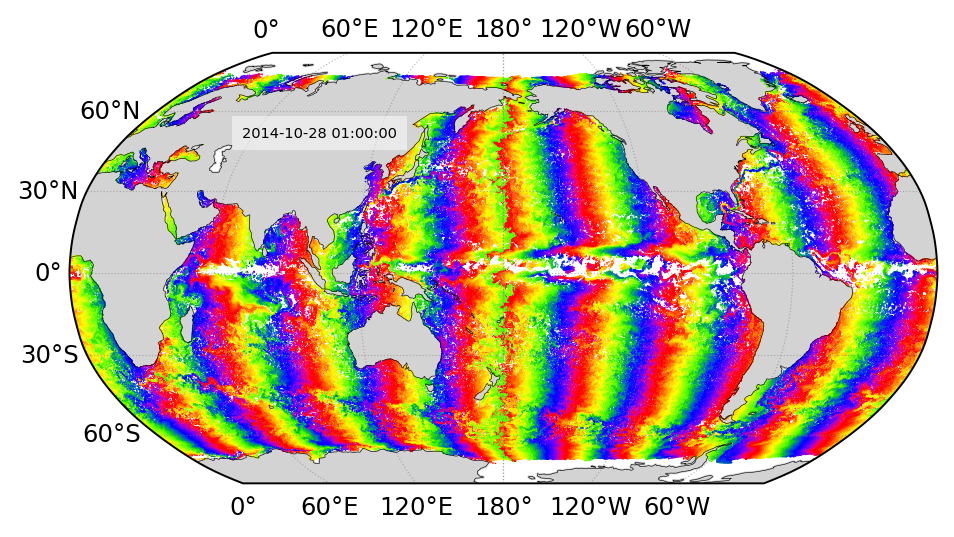

In [10]:
# defines the median time for the choice of colors of the particles
b0 = time == plottimes[starttime + 30]

# create the figure; if you want to create a nicer animation, you can increase the dpi to 300 or 600
fig = plt.figure(dpi=175)

ax1 = fig.add_subplot(1,1,1, projection=ccrs.Robinson(central_longitude=180))
ax1.set_facecolor("white")
ax1.add_feature(cartopy.feature.LAND, zorder=1,color='lightgray')
ax1.coastlines(linewidth=0.25, edgecolor='black')
ax1.gridlines(draw_labels=True, linewidth=0.5, color='gray', alpha=0.5, linestyle=':')
scat1 = ax1.scatter(
    lon[b],
    lat[b],
    marker=".",
    s=1,
    c=lon[b0], # color by the longitude at median time
    cmap='prism',
    vmin=-180,
    vmax=180,   
    edgecolor="none",
    linewidth=0.1,
    transform=ccrs.PlateCarree(),
)
text1 = ax1.text(55, 50, plottimes[starttime].astype('datetime64[s]').astype('O').strftime('%Y-%m-%d %H:%M:%S'), 
                 fontsize=6, color='black', transform=ccrs.PlateCarree(), bbox=dict(facecolor='white', alpha=0.5, edgecolor='none'))

In [11]:
# define the frames, here 60
frames = np.arange(0, 60)

def animate(t):
    b = time == plottimes[t + starttime]
    scat1.set_offsets(np.vstack((lon[b], lat[b])).transpose())
    text1.set_text(plottimes[t + starttime].astype('datetime64[s]').astype('O').strftime('%Y-%m-%d %H:%M:%S'))
    return scat1, text1

anim = animation.FuncAnimation(fig, animate, frames=frames, interval=150, blit=True)
anim

# needed for tight_layout to work with cartopy
fig.canvas.draw()
plt.tight_layout()

# save the animation
writergif = PillowWriter(fps=6)
fileout = 'traj-robinson-0-60-hsv.gif'
anim.save(fileout,writer=writergif)

<Figure size 640x480 with 0 Axes>

Let's display the gif in the notebook. The particles are colored by their longitude (with a repeated colorscale) at the median time, that is day 30 out of 60 days. As such, during the first half of the animation you can visualize the longitudes where the particles will be at day 30. During the second half, you can visualize the longitudes where the particles used to be.  

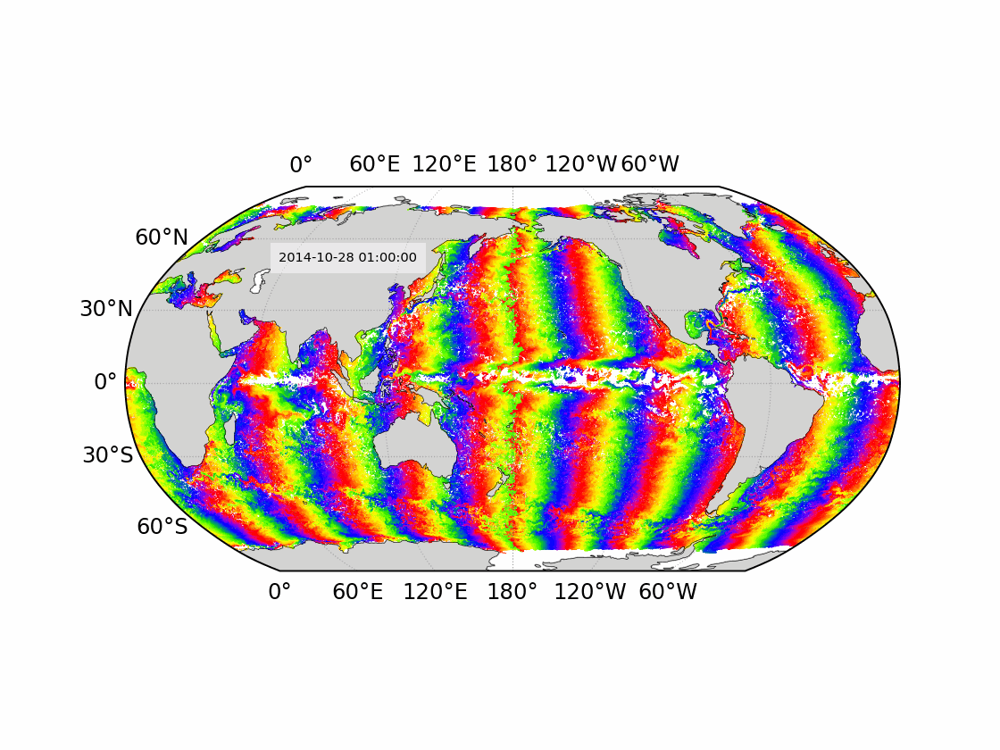

In [12]:
from IPython.display import Image
Image(filename=fileout)